In [1]:
import cv2
import numpy as np
from matplotlib import pyplot as plt
from skimage.segmentation import slic
from skimage.color import rgb2lab

##
## Utility Functions

In [2]:
def read_video_first_frame(video_path):
    cap = cv2.VideoCapture(video_path)
    ret, frame = cap.read()
    if not ret:
        print("Cannot read video.")
        cap.release()
        return None, None, None
    return cap, frame, ret

def load_template(initial_template_path, frame_gray):
    template = cv2.imread(initial_template_path, cv2.IMREAD_GRAYSCALE)
    if template is None:
        print("Template image not found or failed to load.")
        return None

    coords = cv2.findNonZero(template)
    if coords is None:
        print("No non-zero pixels in template.")
        return None

    x, y, w, h = cv2.boundingRect(coords)
    cropped_template = frame_gray[y:y+h, x:x+w]
    return cropped_template, (x, y, w, h)

def setup_video_writer(output_path, frame_shape, fps):
    frame_h, frame_w = frame_shape[:2]
    fourcc = cv2.VideoWriter_fourcc(*'mp4v')
    out = cv2.VideoWriter(output_path, fourcc, fps, (frame_w, frame_h))
    print(f"💾 Output video will be saved to: {output_path}")
    return out



##
## Localization: Template Matching + Bank

In [6]:
def get_patch(frame_gray, template_coords, padding=10):
    x, y, w, h = template_coords
    x_start = max(0, x - padding)
    y_start = max(0, y - padding)
    x_end = min(frame_gray.shape[1], x + w + padding)
    y_end = min(frame_gray.shape[0], y + h + padding)

    patch = frame_gray[y_start:y_end, x_start:x_end]
    patch_loc = (x_start, y_start)  # top-left of patch

    return patch, patch_loc

def display_patch(patch, frame_idx, padding):
    plt.figure(figsize=(4, 4))
    plt.imshow(patch, cmap='gray')
    plt.title(f"Patch (Frame {frame_idx}, Padding {padding})")
    plt.axis('off')
    plt.show()

def find_best_match(search_patch):
    global template_bank
    
    best_score = -1
    best_box = None
    boxes = []
    scores = []

    for template in template_bank:
        if search_patch.shape[0] < template.shape[0] or search_patch.shape[1] < template.shape[1]:
            continue  # Skip if template is larger than the search patch

        result = cv2.matchTemplate(search_patch, template, cv2.TM_CCOEFF_NORMED)
        min_val, max_val, min_loc, max_loc = cv2.minMaxLoc(result)

        if max_val > best_score:
            best_score = max_val
            best_box = (*max_loc, template.shape[1], template.shape[0])  # (x, y, w, h)

        boxes.append((*max_loc, template.shape[1], template.shape[0]))
        scores.append(max_val)

    if best_box is None:
        best_box = (0, 0, 0, 0)

    return boxes, scores, best_score


def update_template_from_box(frame_gray, box):
    x, y, w, h = box
    new_template = frame_gray[y:y+h, x:x+w]
    coords = cv2.findNonZero(new_template)
    if coords is not None:
        x_, y_, w_, h_ = cv2.boundingRect(coords)
        return new_template[y_:y_+h_, x_:x_+w_]
    return new_template

def add_to_template_bank(patch):
    global template_bank
    
    template_bank.append(patch)
    if len(template_bank) > TEMPLATE_BANK_SIZE:
        template_bank.pop(0)

def apply_nms(boxes, scores, threshold, nms_thresh):
    if not boxes:
        return []

    indices = cv2.dnn.NMSBoxes(boxes, scores, threshold, nms_thresh)
    if len(indices) == 0:
        return []

    # Flatten indices to list of integers
    return [i[0] if isinstance(i, (list, np.ndarray)) else i for i in indices]

def template_difference(template1, template2, threshold=0.2):
    if template1.shape != template2.shape:
        return True
    diff = np.mean((template1.astype(np.float32) - template2.astype(np.float32)) ** 2)
    norm = np.mean(template1.astype(np.float32) ** 2)
    nmse = diff / (norm + 1e-8)
    return nmse > threshold

#================================================#
#======= FOR TEMPLATE BANK VISUALIZATION ========#
#================================================#

def get_template_index(template, template_bank):
    for i, t in enumerate(template_bank):
        if np.array_equal(t, template):
            return i
    return None  # Not found

def visualize_template_bank(template_bank, current_index=None, max_per_row=5, figsize=(15, 5), cmap='gray'):
    n = len(template_bank)
    if n == 0:
        print("⚠️ Template bank is empty.")
        return

    cols = min(n, max_per_row)
    rows = (n + cols - 1) // cols

    plt.figure(figsize=figsize)
    for i, template in enumerate(template_bank):
        ax = plt.subplot(rows, cols, i + 1)
        plt.imshow(template, cmap=cmap)
        title = f"Template {i}"
        if i == current_index:
            # Highlight current template with red title and border
            title += " (Current)"
            ax.set_title(title, color='red')
            for spine in ax.spines.values():
                spine.set_edgecolor('red')
                spine.set_linewidth(2)
        else:
            ax.set_title(title)
        plt.axis('off')

    plt.tight_layout()
    plt.show()

##
## Main Program

In [8]:
def draw_tracking_box(frame, box):
    x, y, w, h = box
    cv2.rectangle(frame, (x, y), (x + w, y + h), (0, 255, 255), 2)

def display_frame(frame, frame_idx):
    frame_rgb = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)
    plt.figure(figsize=(10, 5))
    plt.imshow(frame_rgb)
    plt.title(f"Frame {frame_idx}")
    plt.axis('off')
    plt.show()

def run_grabcut_refinement(frame, init_mask, rect):
    """
    Run GrabCut segmentation within bounding box rect.
    init_mask: binary mask inside rect (0 or 1).
    rect: (x, y, w, h)
    Returns refined binary mask for rect area.
    """
    x, y, w, h = rect
    roi = frame[y:y+h, x:x+w]

    # Initialize mask for GrabCut
    grabcut_mask = np.full(roi.shape[:2], cv2.GC_PR_BGD, dtype=np.uint8)
    grabcut_mask[init_mask == 1] = cv2.GC_FGD  # Foreground pixels
    grabcut_mask[init_mask == 0] = cv2.GC_PR_BGD # Probable background

    bgdModel = np.zeros((1, 65), np.float64)
    fgdModel = np.zeros((1, 65), np.float64)

    cv2.grabCut(roi, grabcut_mask, None, bgdModel, fgdModel, 5, cv2.GC_INIT_WITH_MASK)

    # Final mask: 0 and 2 are background, 1 and 3 are foreground
    refined_mask = np.where((grabcut_mask == 1) | (grabcut_mask == 3), 1, 0).astype(np.uint8)

    return refined_mask

def graphcut_segmentation_fullframe(frame, user_scribble_mask):
    """
    Your graph cut segmentation for the full frame on keyframes.
    user_scribble_mask: binary mask user initialized on first frame.
    Returns binary foreground mask for full frame.
    """
    # Implement or call your graph cut segmentation here.
    # Placeholder - replace with your actual graph cut code.
    # For now, just return user_scribble_mask to keep flow.
    return user_scribble_mask.copy()

def dynamic_cinematic_blur_pipeline(
    video_path,
    initial_mask,
    initial_template,
    template_coords,
    user_scribble_mask,
    graphcut_interval=15,
    threshold=0.7,
    nms_thresh=0.3,
    output_path=None
):
    cap = cv2.VideoCapture(video_path)
    ret, frame = cap.read()
    if not ret:
        print("Cannot read video.")
        return

    fps = cap.get(cv2.CAP_PROP_FPS) or 30
    H_full, W_full = frame.shape[:2]

    prev_gray = cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY)
    prev_mask = np.zeros((H_full, W_full), dtype=np.uint8)
    x, y, w, h = template_coords
    prev_mask[y:y+h, x:x+w] = initial_mask

    template = initial_template.copy()
    template_coords = template_coords

    if output_path:
        fourcc = cv2.VideoWriter_fourcc(*"mp4v")
        out = cv2.VideoWriter(output_path, fourcc, fps, (W_full, H_full))
    else:
        out = None

    frame_idx = 0

    while True:
        if frame_idx != 0:
            ret, frame = cap.read()
            if not ret:
                print("Video ended.")
                break
            curr_gray = cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY)
        else:
            curr_gray = prev_gray.copy()

        # 1. Localization via your template matching (you implement or reuse)
        # For now, assume template_coords = previous tracked box (you should update this with your matcher)
        global_box = template_coords
        x, y, w, h = global_box

        # 2. Extract ROI and mask from previous frame
        prev_roi_mask = prev_mask[y:y+h, x:x+w]

        # 3. Refine mask inside ROI using GrabCut initialized by prev mask
        refined_mask_roi = run_grabcut_refinement(frame, prev_roi_mask, global_box)

        # 4. Place refined ROI mask into full-size mask
        refined_mask = np.zeros_like(prev_mask)
        refined_mask[y:y+h, x:x+w] = refined_mask_roi

        # 5. Periodically, run full-frame graph cut to reset drift
        if frame_idx % graphcut_interval == 0 and frame_idx != 0:
            refined_mask = graphcut_segmentation_fullframe(frame, user_scribble_mask)
            print(f"[Frame {frame_idx}] Graph cut full-frame refinement done.")

        # 6. Update template using refined mask region (optional - based on your logic)
        binary_mask_roi = refined_mask[y:y+h, x:x+w]
        segmented_template = cv2.bitwise_and(curr_gray[y:y+h, x:x+w], curr_gray[y:y+h, x:x+w], mask=binary_mask_roi)

        # Update template if different enough (reuse your template_difference function)
        if template_difference(segmented_template, template, threshold=0.2):
            template = segmented_template
            template_coords = global_box
            print(f"[Frame {frame_idx}] Template updated.")

        # 7. Visualization
        overlay = frame.copy()
        overlay[refined_mask > 0] = (0, 255, 0)  # green overlay foreground
        draw_tracking_box(overlay, global_box)
        display_frame(overlay, frame_idx)

        # 8. Write output
        if out:
            out.write(overlay)

        # 9. Prepare for next frame
        prev_gray = curr_gray.copy()
        prev_mask = refined_mask.copy()
        frame_idx += 1

    cap.release()
    if out:
        out.release()
    print("Processing finished.")

[Frame 0] Template updated.


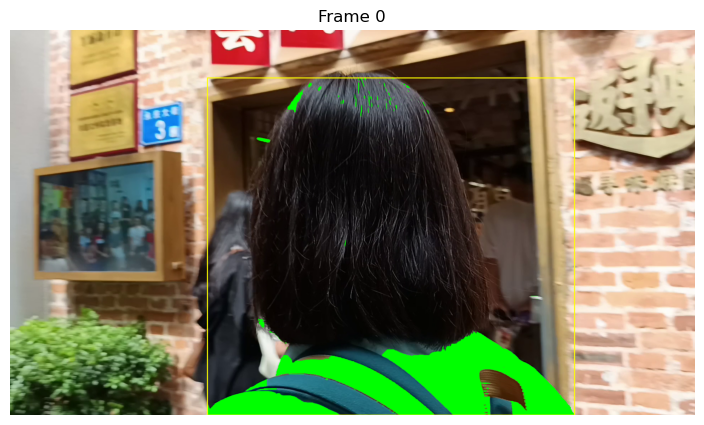

[Frame 1] Template updated.


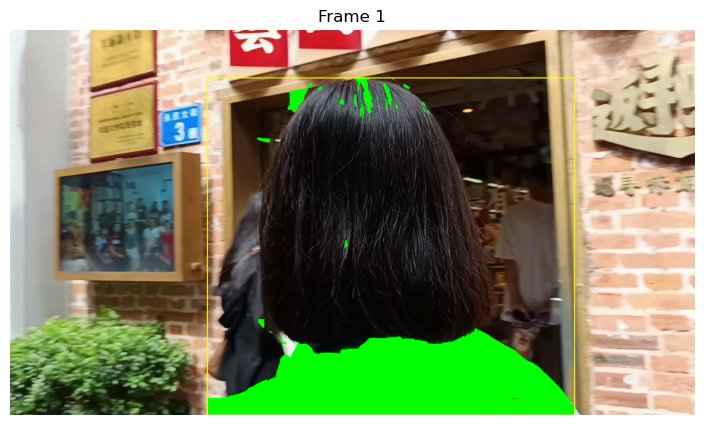

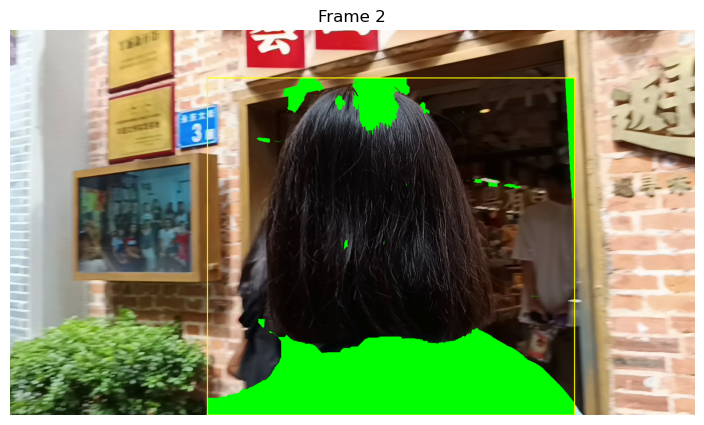

[Frame 3] Template updated.


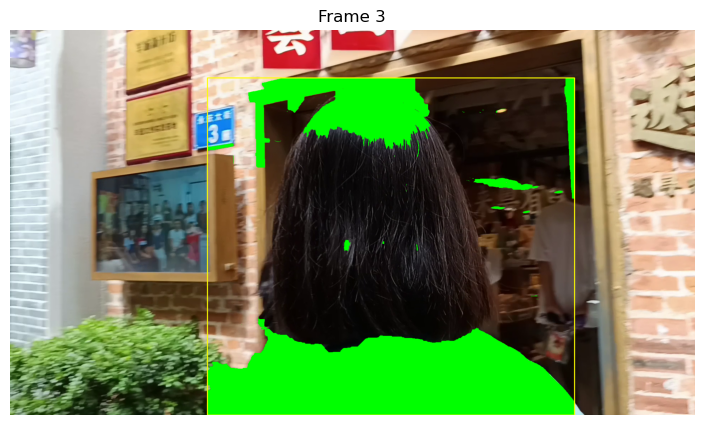

[Frame 4] Template updated.


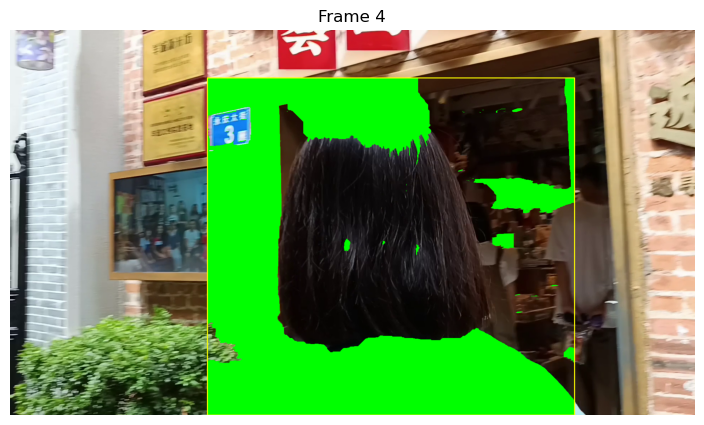

[Frame 5] Template updated.


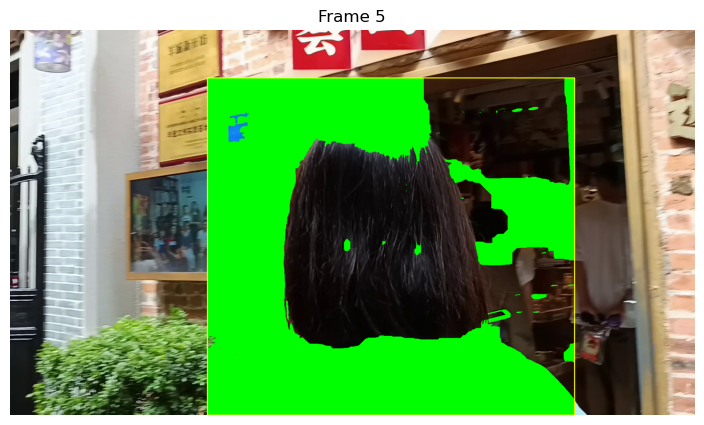

[Frame 6] Template updated.


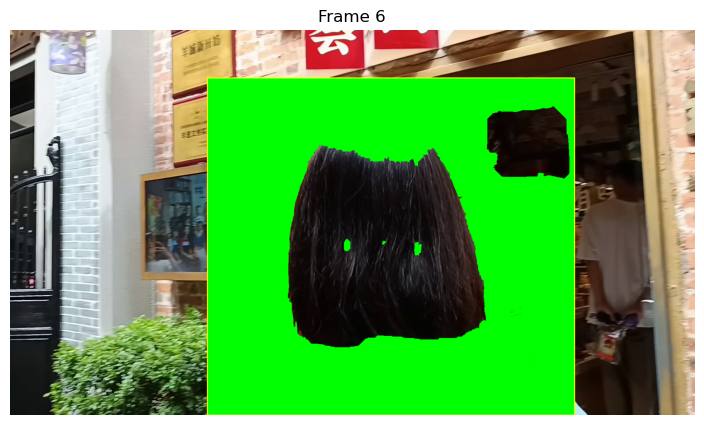

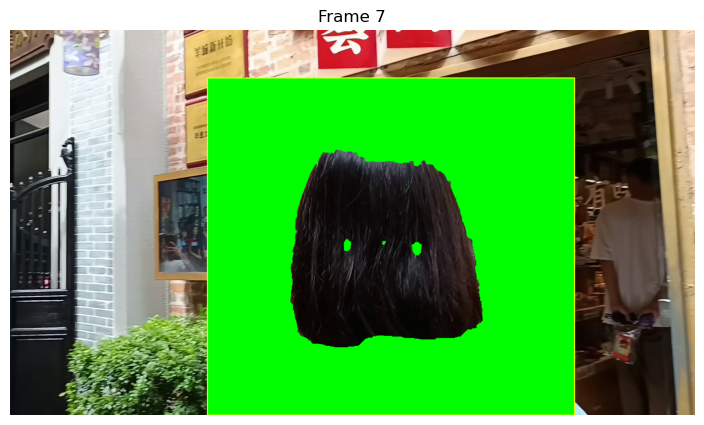

[Frame 8] Template updated.


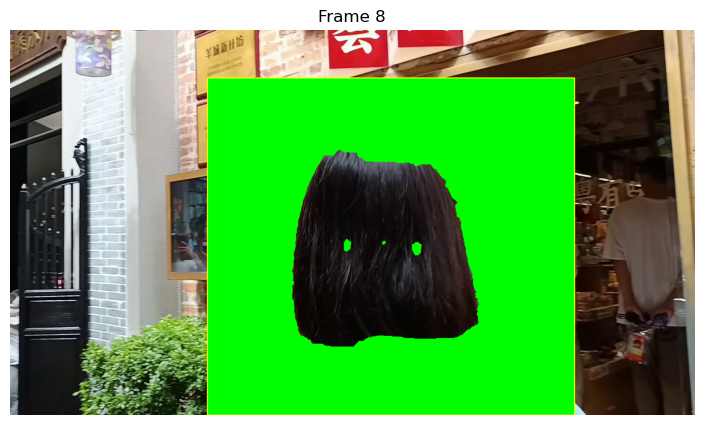

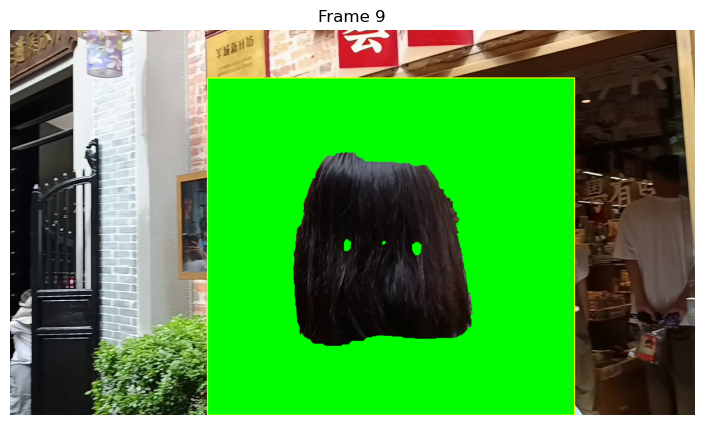

[Frame 10] Template updated.


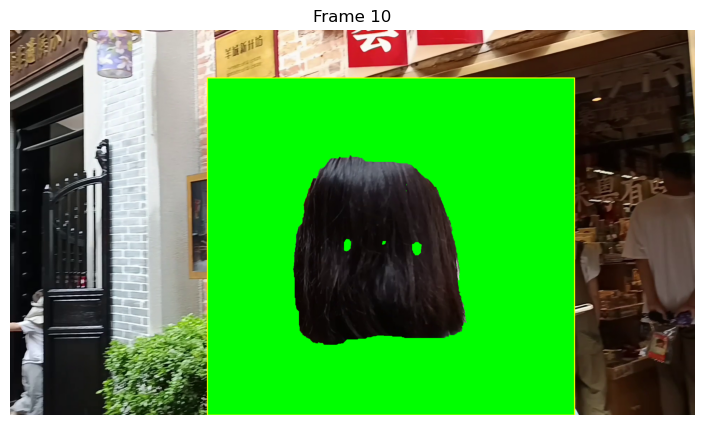

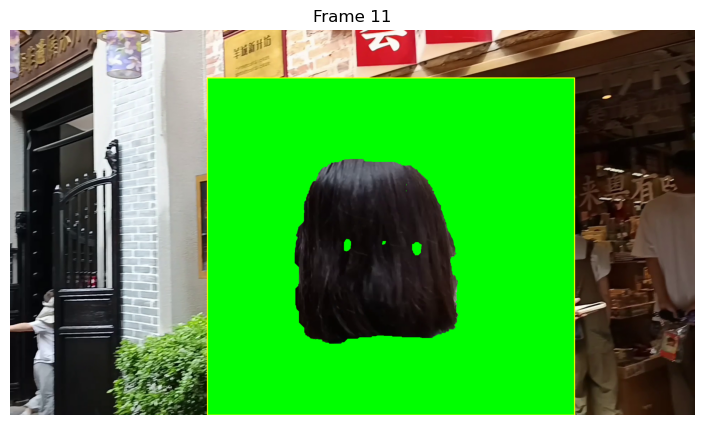

[Frame 12] Template updated.


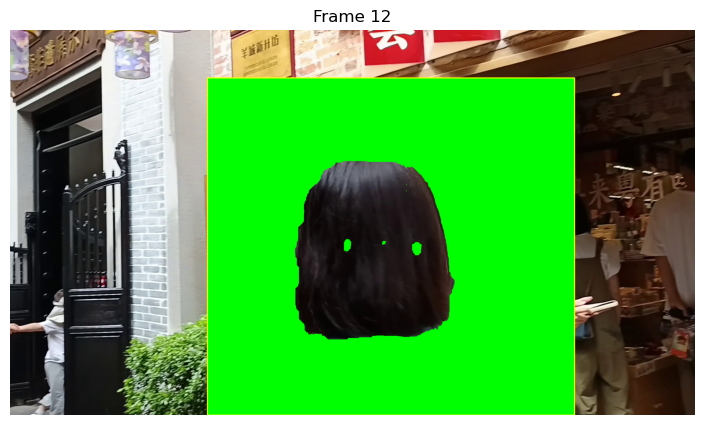

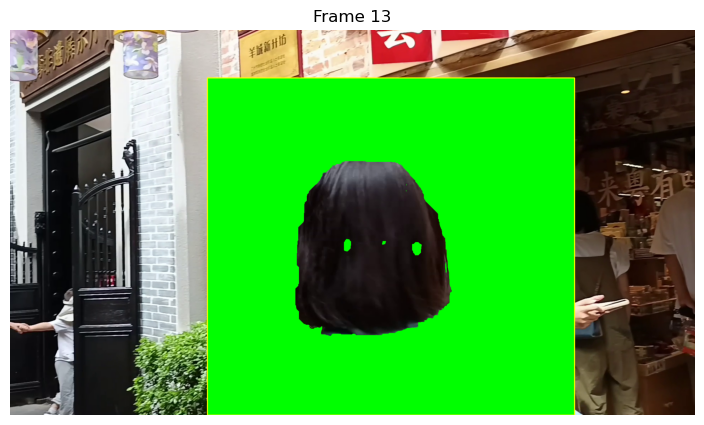

[Frame 14] Template updated.


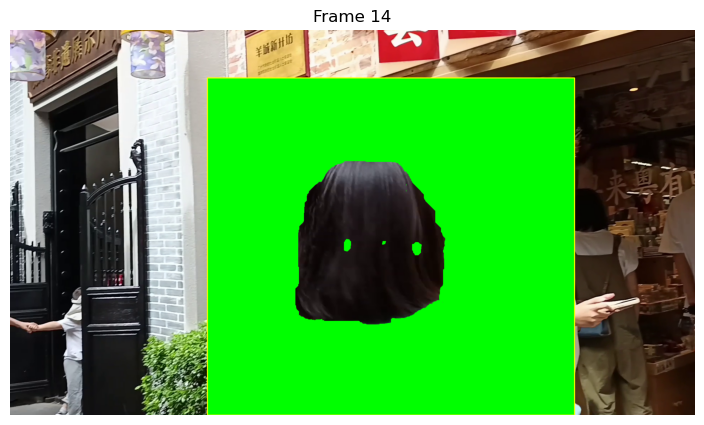

[Frame 15] Graph cut full-frame refinement done.
[Frame 15] Template updated.


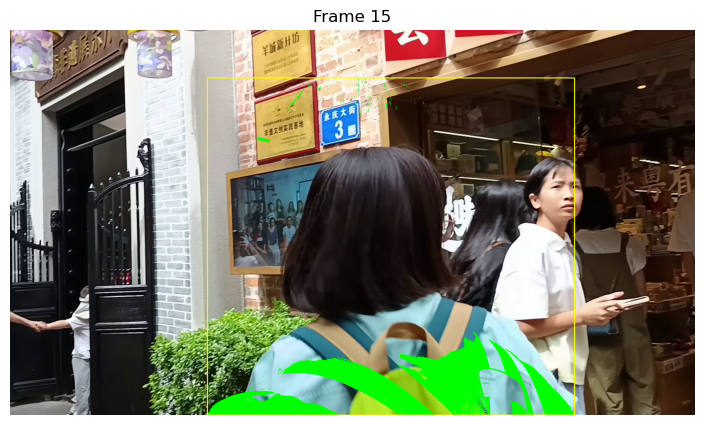

[Frame 16] Template updated.


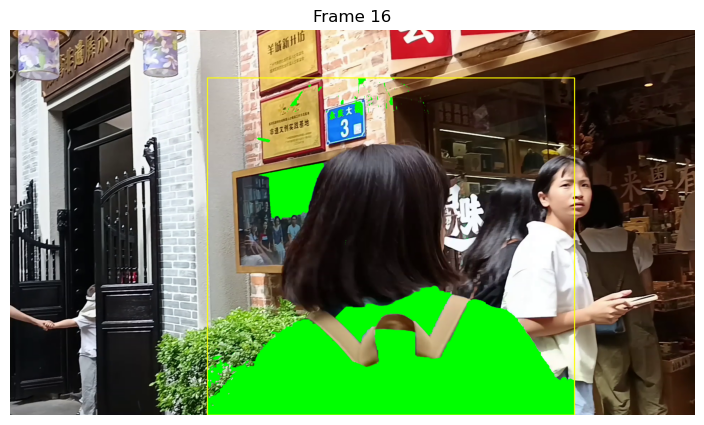

[Frame 17] Template updated.


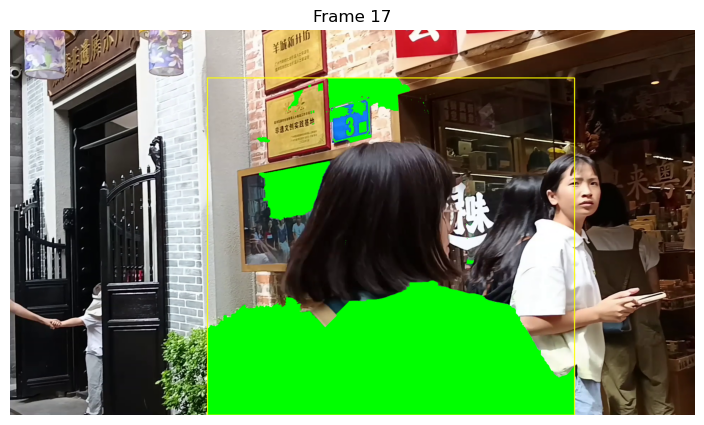

[Frame 18] Template updated.


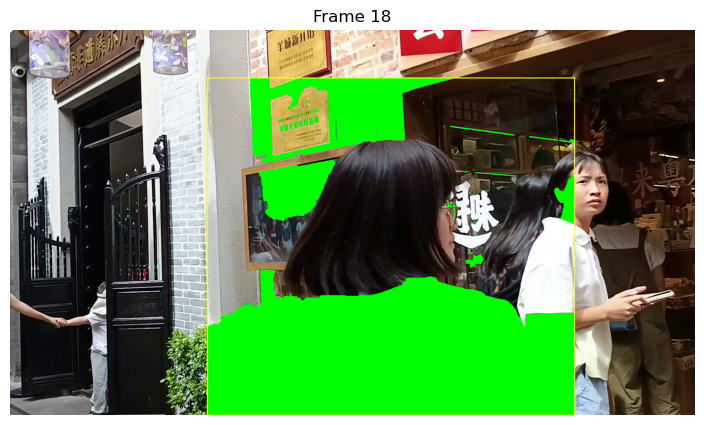

[Frame 19] Template updated.


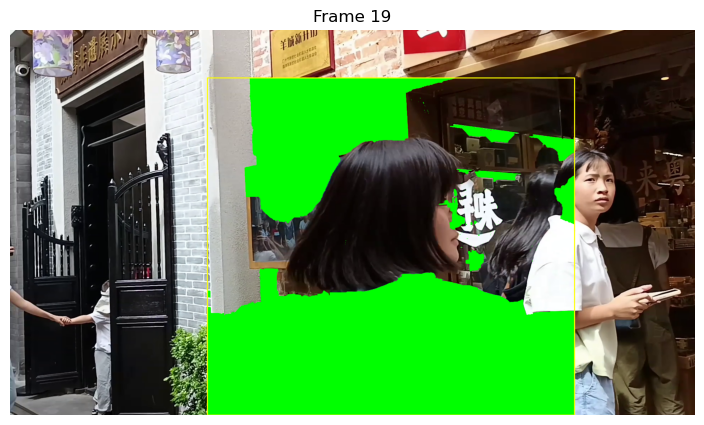

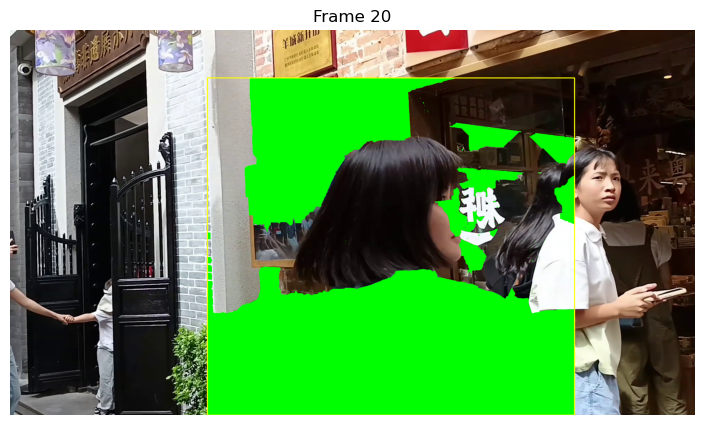

[Frame 21] Template updated.


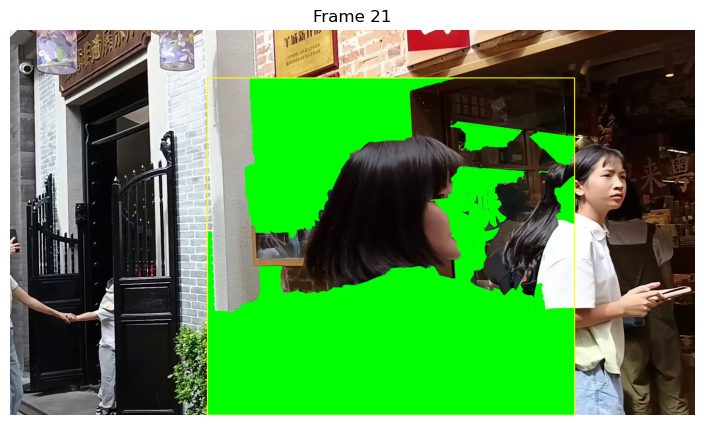

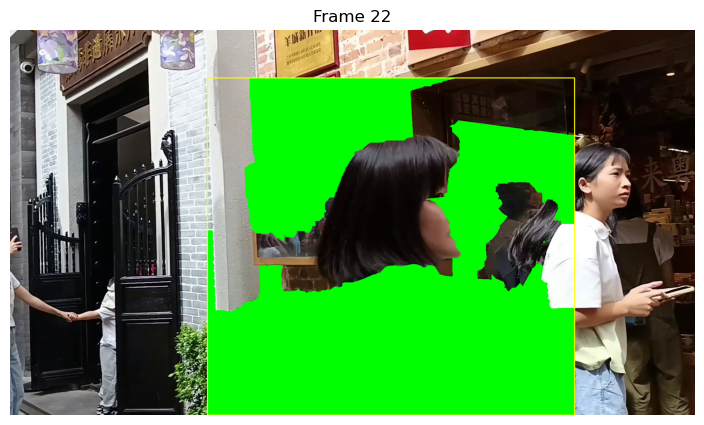

[Frame 23] Template updated.


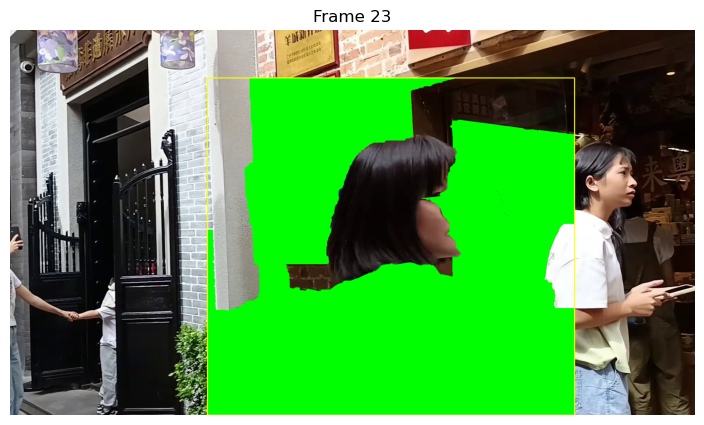

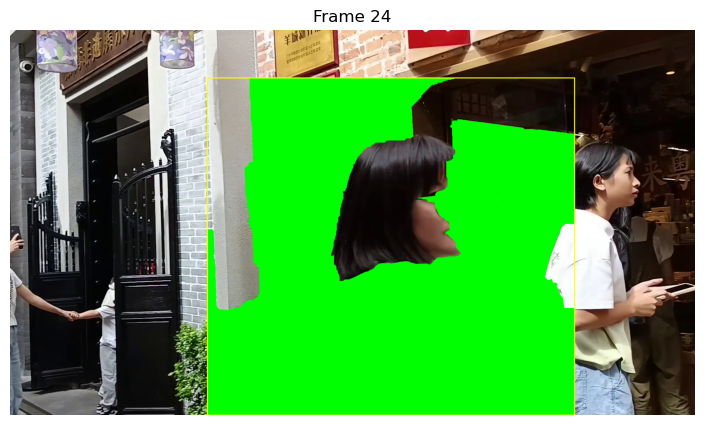

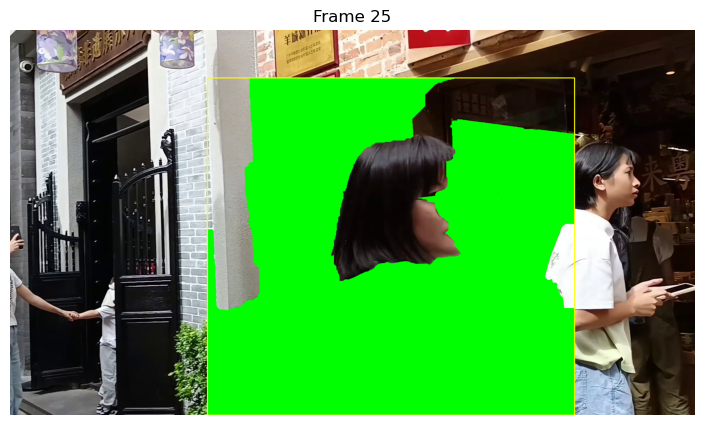

[Frame 26] Template updated.


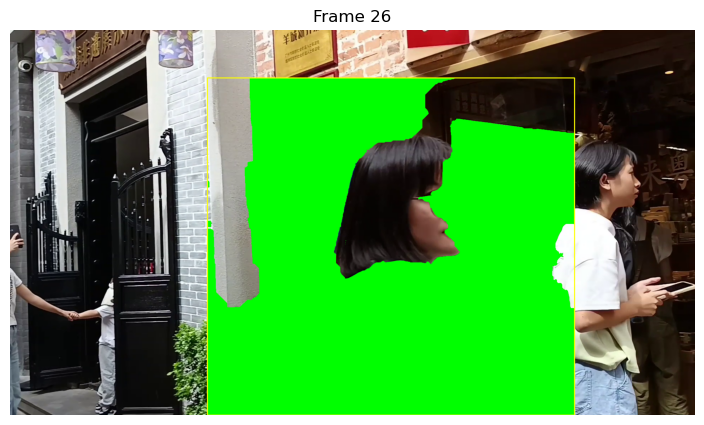

[Frame 27] Template updated.


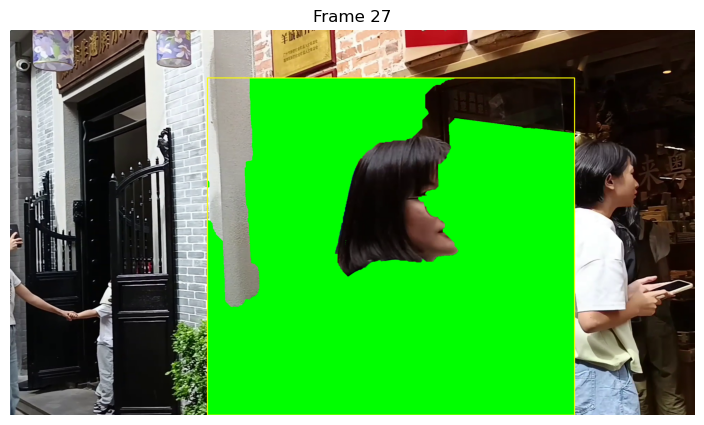

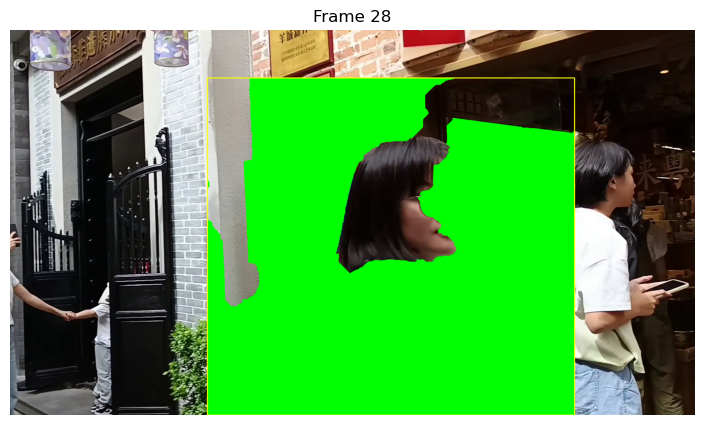

[Frame 29] Template updated.


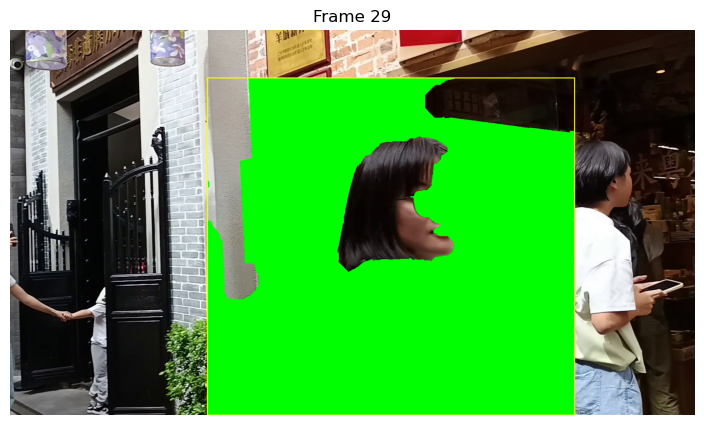

[Frame 30] Graph cut full-frame refinement done.
[Frame 30] Template updated.


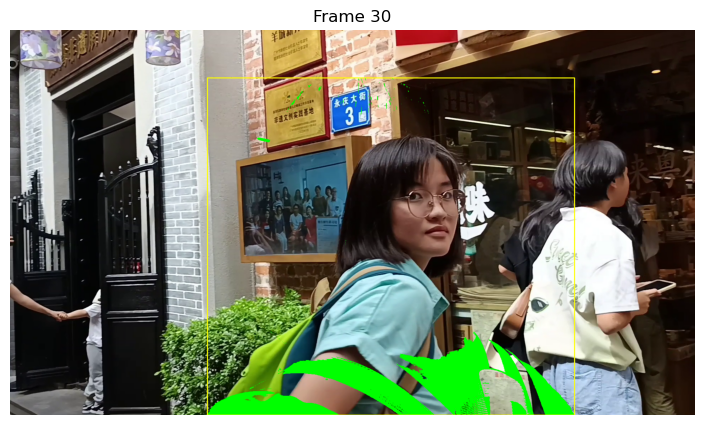

KeyboardInterrupt: 

In [9]:
# Your paths
video_path = "../../videos/ficen_trimmed.mp4"
template_path = "../../outputs/segmented/ficen_trimmed_segmented.png"
output_path = "../../outputs/dttm_output.mp4"

# Load the segmented template image (assumed grayscale mask with foreground in white)
initial_mask_img = cv2.imread(template_path, cv2.IMREAD_GRAYSCALE)
if initial_mask_img is None:
    raise FileNotFoundError(f"Cannot read template mask image at {template_path}")

# Binarize mask (threshold at 128)
_, initial_mask = cv2.threshold(initial_mask_img, 128, 1, cv2.THRESH_BINARY)

# Find bounding box around mask to get template coords
ys, xs = np.where(initial_mask == 1)
x, y, w, h = xs.min(), ys.min(), xs.max() - xs.min() + 1, ys.max() - ys.min() + 1
template_coords = (x, y, w, h)

# Crop the initial mask and template from the segmented image
initial_mask_cropped = initial_mask[y:y+h, x:x+w].astype(np.uint8)

# Load the corresponding grayscale frame to extract template
cap = cv2.VideoCapture(video_path)
ret, first_frame = cap.read()
if not ret:
    raise RuntimeError("Cannot read video first frame.")
first_frame_gray = cv2.cvtColor(first_frame, cv2.COLOR_BGR2GRAY)
cap.release()

initial_template = first_frame_gray[y:y+h, x:x+w].copy()

# Optional: user scribble mask (full frame) - here we just use the initial mask placed back in full frame
frame_h, frame_w = first_frame_gray.shape
user_scribble_mask = np.zeros((frame_h, frame_w), dtype=np.uint8)
user_scribble_mask[y:y+h, x:x+w] = initial_mask_cropped

# Now run the cinematic blur pipeline (you need to have this function implemented as discussed)
dynamic_cinematic_blur_pipeline(
    video_path=video_path,
    initial_mask=initial_mask_cropped,     # binary mask cropped
    initial_template=initial_template,     # grayscale template patch
    template_coords=template_coords,
    user_scribble_mask=user_scribble_mask,
    graphcut_interval=15,
    threshold=0.3,
    nms_thresh=0.3,
    output_path=output_path
)